In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [62]:
col_names = ['pregnant', 'glucose', 'bp', 'skin', 'insulin', 'bmi', 'pedigree', 'age', 'label']
diabetes_data = pd.read_csv("diabetes.csv", header=None, names=col_names)
diabetes_data.head()

,pregnant,glucose,bp,skin,insulin,bmi,pedigree,age,label
0,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
1,6,148,72,35,0,33.6,0.627,50,1
2,1,85,66,29,0,26.6,0.351,31,0
3,8,183,64,0,0,23.3,0.672,32,1
4,1,89,66,23,94,28.1,0.167,21,0


In [63]:
diabetes_data = diabetes_data.iloc[1:]
diabetes_data.head()

,pregnant,glucose,bp,skin,insulin,bmi,pedigree,age,label
1,6,148,72,35,0,33.6,0.627,50,1
2,1,85,66,29,0,26.6,0.351,31,0
3,8,183,64,0,0,23.3,0.672,32,1
4,1,89,66,23,94,28.1,0.167,21,0
5,0,137,40,35,168,43.1,2.288,33,1


In [64]:
diabetes_data.shape

(768, 9)

In [65]:
diabetes_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 1 to 768
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   pregnant  768 non-null    object
 1   glucose   768 non-null    object
 2   bp        768 non-null    object
 3   skin      768 non-null    object
 4   insulin   768 non-null    object
 5   bmi       768 non-null    object
 6   pedigree  768 non-null    object
 7   age       768 non-null    object
 8   label     768 non-null    object
dtypes: object(9)
memory usage: 27.1+ KB


In [66]:
diabetes_data.describe().T

,count,unique,top,freq
pregnant,768,17,1,135
glucose,768,136,99,17
bp,768,47,70,57
skin,768,51,0,227
insulin,768,186,0,374
bmi,768,248,32,13
pedigree,768,517,0.258,6
age,768,52,22,72
label,768,2,0,500


In [67]:
diabetes_data.isnull().sum()

pregnant    0
glucose     0
bp          0
skin        0
insulin     0
bmi         0
pedigree    0
age         0
label       0
dtype: int64

<AxesSubplot:xlabel='label', ylabel='count'>

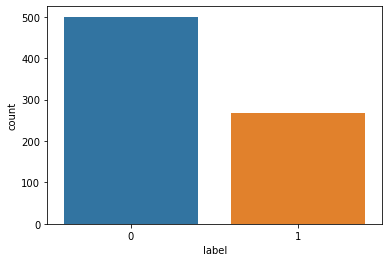

In [68]:
sns.countplot(x='label',data=diabetes_data)

In [69]:
diabetes_data["pregnant"].replace(np.NaN,diabetes_data["pregnant"].mean(),inplace=True)
diabetes_data["glucose"].replace(np.NaN,diabetes_data["glucose"].mean(),inplace=True)
diabetes_data["bp"].replace(np.NaN,diabetes_data["bp"].mean(),inplace=True)
diabetes_data["skin"].replace(np.NaN,diabetes_data["skin"].mean(),inplace=True)
diabetes_data["insulin"].replace(np.NaN,diabetes_data["insulin"].mean(),inplace=True)
diabetes_data["bmi"].replace(np.NaN,diabetes_data["bmi"].astype(float).mean(),inplace=True)
diabetes_data["age"].replace(np.NaN,diabetes_data["age"].astype(float).mean(),inplace=True)
diabetes_data["pedigree"].replace(np.NaN,diabetes_data["pedigree"].astype(float).mean(),inplace=True)
diabetes_data.head()

,pregnant,glucose,bp,skin,insulin,bmi,pedigree,age,label
1,6,148,72,35,0,33.6,0.627,50,1
2,1,85,66,29,0,26.6,0.351,31,0
3,8,183,64,0,0,23.3,0.672,32,1
4,1,89,66,23,94,28.1,0.167,21,0
5,0,137,40,35,168,43.1,2.288,33,1


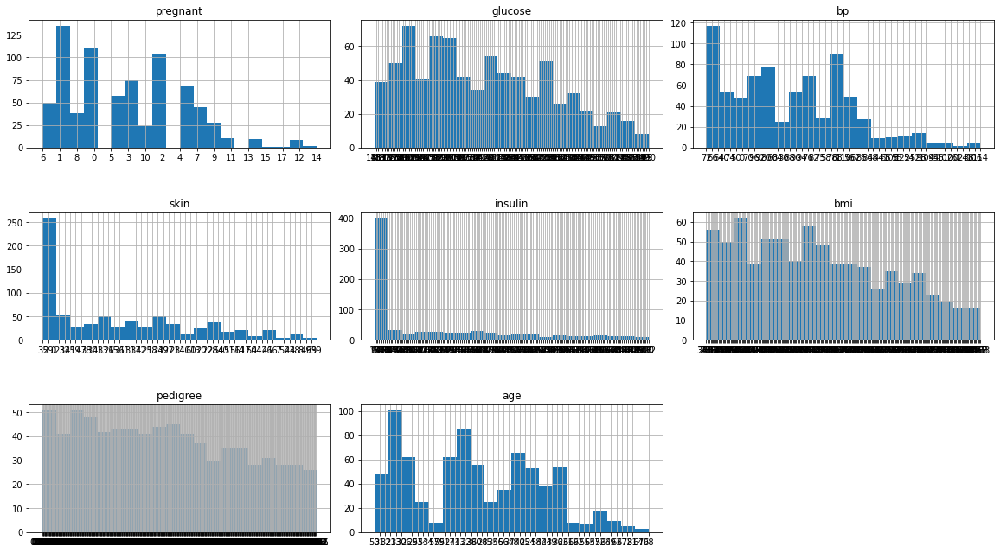

In [59]:
import itertools

col=diabetes_data.columns[:8]
plt.subplots(figsize=(20,15))
length=len(col)
for i,j in itertools.zip_longest(col,range(length)):
    plt.subplot((length/2),3,j+1)
    plt.subplots_adjust(wspace=0.1,hspace=0.5)
    diabetes_data[i].hist(bins=20)
    plt.title(i)
plt.show()

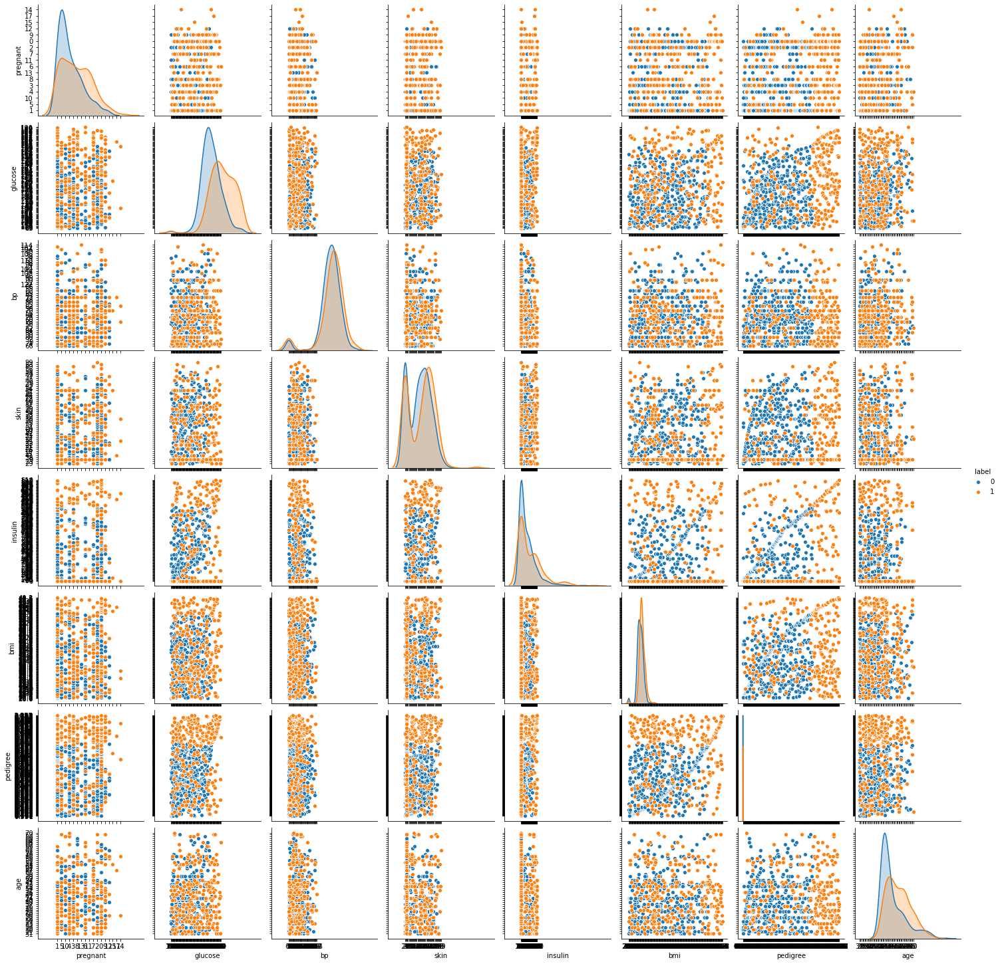

In [60]:
sns.pairplot(data=diabetes_data,hue='label')
plt.show()

In [70]:
diabetes_data.describe()

,pregnant,glucose,bp,skin,insulin,bmi,pedigree,age,label
count,768,768,768,768,768,768,768,768,768
unique,17,136,47,51,186,248,517,52,2
top,1,99,70,0,0,32,0.258,22,0
freq,135,17,57,227,374,13,6,72,500


In [71]:
from sklearn.preprocessing import MinMaxScaler
sc=MinMaxScaler(feature_range=(0,1))
diabetes_scaled=sc.fit_transform(diabetes_data)
diabetes_scaled=pd.DataFrame(diabetes_scaled)
diabetes_scaled.head()

,0,1,2,3,4,5,6,7,8
0,0.352941,0.743719,0.590164,0.353535,0.000000,0.500745,0.234415,0.483333,1.0
1,0.058824,0.427136,0.540984,0.292929,0.000000,0.396423,0.116567,0.166667,0.0
2,0.470588,0.919598,0.524590,0.000000,0.000000,0.347243,0.253629,0.183333,1.0
3,0.058824,0.447236,0.540984,0.232323,0.111111,0.418778,0.038002,0.000000,0.0
4,0.000000,0.688442,0.327869,0.353535,0.198582,0.642325,0.943638,0.200000,1.0


In [72]:
feature_cols = ['pregnant', 'insulin', 'bmi', 'age','glucose','bp','pedigree']
X = diabetes_data[feature_cols] # Features
y = diabetes_data.label # Target variable

In [73]:
X.head()

,pregnant,insulin,bmi,age,glucose,bp,pedigree
1,6,0,33.6,50,148,72,0.627
2,1,0,26.6,31,85,66,0.351
3,8,0,23.3,32,183,64,0.672
4,1,94,28.1,21,89,66,0.167
5,0,168,43.1,33,137,40,2.288


In [74]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.25,random_state=0)

In [75]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 576 entries, 763 to 685
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   pregnant  576 non-null    object
 1   insulin   576 non-null    object
 2   bmi       576 non-null    object
 3   age       576 non-null    object
 4   glucose   576 non-null    object
 5   bp        576 non-null    object
 6   pedigree  576 non-null    object
dtypes: object(7)
memory usage: 20.2+ KB


In [76]:
X_train.head().T

,763,128,565,376,664
pregnant,9,1,0,12,9
insulin,0,94,0,325,130
bmi,22.5,33.3,32.4,39.2,37.9
age,33,23,27,58,40
glucose,89,118,91,140,145
bp,62,58,80,82,80
pedigree,0.142,0.261,0.601,0.528,0.637


In [77]:
y_train.head()

763    0
128    0
565    0
376    1
664    1
Name: label, dtype: object

In [78]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 192 entries, 662 to 464
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   pregnant  192 non-null    object
 1   insulin   192 non-null    object
 2   bmi       192 non-null    object
 3   age       192 non-null    object
 4   glucose   192 non-null    object
 5   bp        192 non-null    object
 6   pedigree  192 non-null    object
dtypes: object(7)
memory usage: 6.8+ KB


In [79]:
X_test.head().T

,662,123,114,15,530
pregnant,1,2,4,5,0
insulin,0,100,0,175,0
bmi,42.9,33.6,34,25.8,24.6
age,22,23,25,51,31
glucose,199,107,76,166,111
bp,76,74,62,72,65
pedigree,1.394,0.404,0.391,0.587,0.66


In [80]:
y_test.head()

662    1
123    0
114    0
15     1
530    0
Name: label, dtype: object

In [81]:
print("X_train shape:",X_train.shape)
print("X_test shape:",X_test.shape)
print("Y_train shape:",y_train.shape)
print("Y_test shape:",y_test.shape)

X_train shape: (576, 7)
X_test shape: (192, 7)
Y_train shape: (576,)
Y_test shape: (192,)


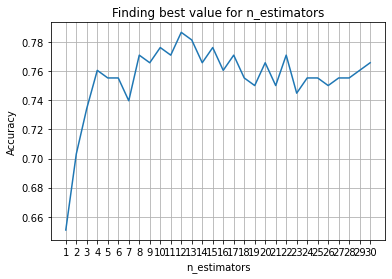

Highest value/accuracy:  0.7864583333333334


In [82]:
from sklearn import metrics
from sklearn.neighbors import KNeighborsClassifier

X_axis=list(range(1,31))
acc=pd.Series()
x=range(1,31)
for i in list(range(1,31)):
    knn_model=KNeighborsClassifier(n_neighbors = i)
    knn_model.fit(X_train,y_train)
    prediction=knn_model.predict(X_test)
    acc=acc.append(pd.Series(metrics.accuracy_score(prediction,y_test)))
plt.plot(X_axis,acc)
plt.xticks(x)
plt.title("Finding best value for n_estimators")
plt.xlabel("n_estimators")
plt.ylabel("Accuracy")
plt.grid()
plt.show()
print('Highest value/accuracy: ',acc.values.max())

In [83]:
from sklearn.linear_model import LogisticRegression

# instantiate the model (using the default parameters)
logreg = LogisticRegression(max_iter = 1000)

# fit the model with data
logreg.fit(X_train,y_train)

LogisticRegression(max_iter=1000)

In [84]:
y_pred=logreg.predict(X_test)
y_pred

array(['1', '0', '0', '1', '0', '0', '1', '1', '0', '0', '1', '1', '0',
       '0', '0', '0', '1', '0', '0', '0', '1', '0', '0', '0', '0', '0',
       '0', '1', '0', '0', '0', '0', '0', '0', '0', '1', '0', '0', '0',
       '1', '0', '0', '0', '1', '1', '0', '0', '0', '0', '0', '0', '0',
       '1', '0', '0', '0', '0', '1', '0', '0', '1', '0', '0', '1', '1',
       '1', '1', '0', '0', '0', '0', '0', '0', '1', '1', '0', '0', '1',
       '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '1', '0', '0',
       '0', '0', '0', '1', '0', '0', '1', '1', '0', '0', '0', '0', '0',
       '1', '0', '0', '0', '0', '1', '0', '0', '1', '0', '1', '1', '0',
       '1', '0', '1', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0',
       '0', '0', '0', '1', '0', '0', '0', '0', '1', '0', '0', '1', '0',
       '0', '0', '0', '0', '0', '0', '0', '0', '1', '0', '0', '1', '0',
       '1', '0', '0', '1', '1', '1', '0', '0', '1', '0', '0', '0', '0',
       '0', '0', '0', '0', '0', '1', '0', '0', '0', '0', '0', '0

In [85]:
X_test


,pregnant,insulin,bmi,age,glucose,bp,pedigree
662,1,0,42.9,22,199,76,1.394
123,2,100,33.6,23,107,74,0.404
114,4,0,34,25,76,62,0.391
15,5,175,25.8,51,166,72,0.587
530,0,0,24.6,31,111,65,0.66
...,...,...,...,...,...,...,...
367,6,0,27.6,29,124,72,0.368
302,2,135,31.6,25,144,58,0.422
383,1,182,25.4,21,109,60,0.947
141,3,0,21.1,55,128,78,0.268


In [86]:
from sklearn import metrics
cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
cnf_matrix

array([[118,  12],
       [ 26,  36]], dtype=int64)

Text(0.5, 257.44, 'Predicted label')

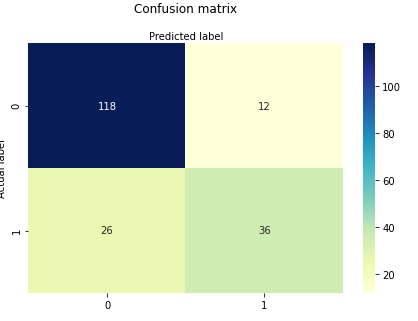

In [87]:
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [88]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8020833333333334


In [89]:
import pickle
import os
#Saving the model
if not os.path.exists('models'):
    os.makedirs('models')
    
MODEL_PATH = "models/logistic_reg.sav"
pickle.dump(logreg, open(MODEL_PATH, 'wb'))

In [90]:
data = [[6, 0, 33.6, 50, 148, 72, 0.627]] 
  
# Create the pandas DataFrame 
df = pd.DataFrame(data, columns = ['pregnant','insulin','bmi','age','glucose','bp','pedigree']) 

#Predict On new Data
new_pred = logreg.predict(df)
new_pred

array(['1'], dtype=object)

In [91]:
data = [[0, 0, 28, 20, 100, 90, 0.627]] 
  
# Create the pandas DataFrame 
df = pd.DataFrame(data, columns = ['pregnant','insulin','bmi','age','glucose','bp','pedigree']) 

#Predict On new Data
new_pred = logreg.predict(df)
new_pred

array(['0'], dtype=object)

In [92]:
print("ACCURACY OF KNN MODEL",acc.values.max()*100)
print("ACCURACY OF LOGISTIC REGRESSION MODEL",metrics.accuracy_score(y_test, y_pred)*100)

ACCURACY OF KNN MODEL 78.64583333333334
ACCURACY OF LOGISTIC REGRESSION MODEL 80.20833333333334
